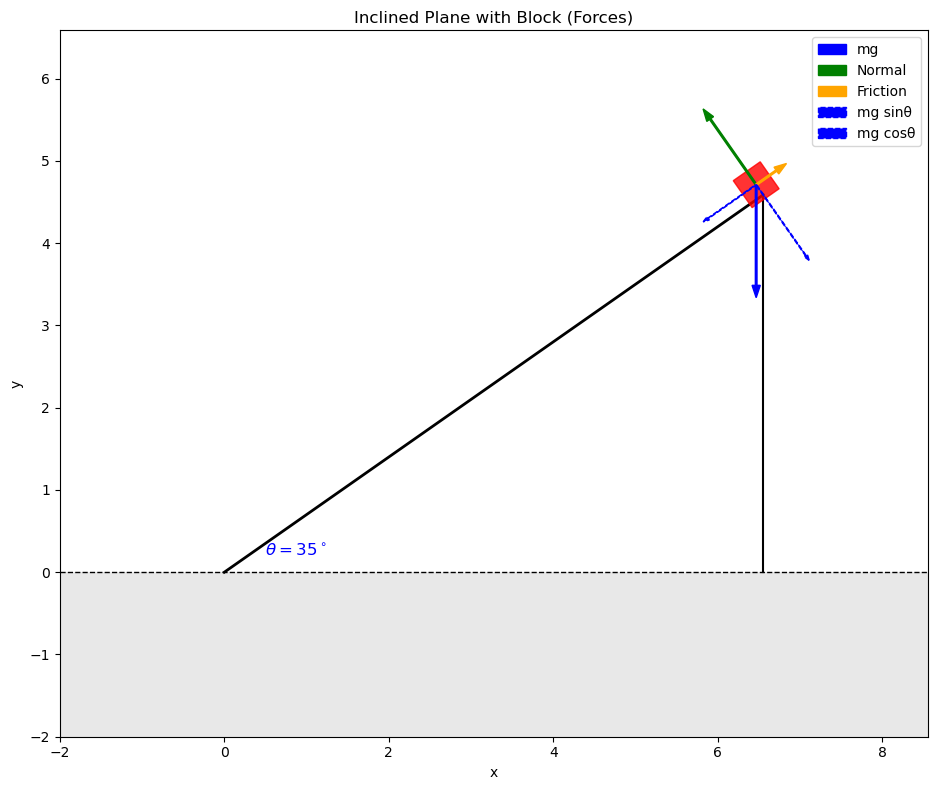

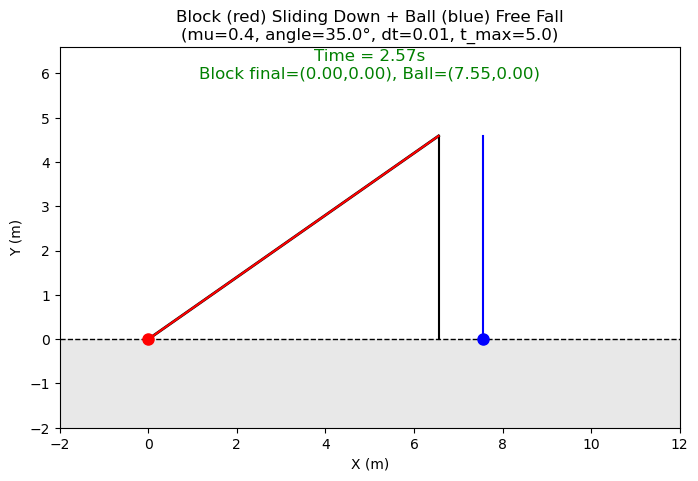

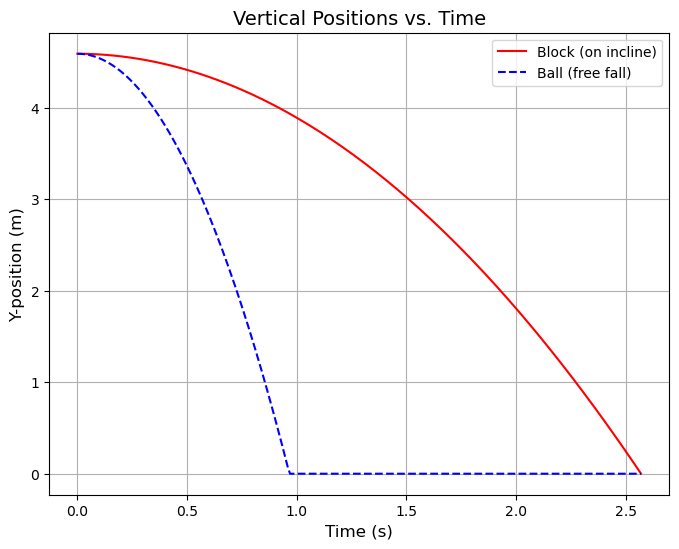

In [6]:
%matplotlib inline

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Polygon
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

###############################
# 1) Simulation of the Block (Sliding DOWN)
###############################
def simulate_inclined_block(m=2.0, mu=0.4, angle_deg=35.0, g=9.81,
                            dt=0.01, t_max=5.0, plane_length=8.0):
    """
    Simulate the motion of a block on an inclined plane with friction.
    The block starts at x = plane_length (the 'top') and slides down to x ~ 0.
    
    Returns:
      time_array: array of time values
      x_array: array of positions along the plane (decreasing from plane_length to near 0)
    """
    theta = np.radians(angle_deg)
    
    mg = m*g
    mg_parallel = mg * np.sin(theta)       # positive
    max_friction = mu * mg * np.cos(theta) # positive
    
    # net_force = friction - mg_parallel
    # => If mg_parallel > friction => net_force < 0 => velocity < 0 => x decreases
    
    time_list = []
    x_list = []
    v_list = []
    
    # Initial conditions (top of plane)
    x = plane_length   # position along plane
    v = 0.0            # velocity along plane
    t = 0.0
    
    while t <= t_max and x >= 0:
        time_list.append(t)
        x_list.append(x)
        v_list.append(v)
        
        if mg_parallel <= max_friction and abs(v) < 1e-12:
            # friction is large enough to prevent motion
            a = 0.0
        else:
            # friction cannot fully oppose mg_parallel
            # if velocity is negative => friction = +max_friction
            # if velocity is positive => friction = -max_friction (less likely here)
            if v <= 0:
                friction_force = max_friction
            else:
                friction_force = -max_friction
            
            net_force = friction_force - mg_parallel
            a = net_force / m
        
        # Euler update
        v += a*dt
        x += v*dt
        t += dt
    
    return np.array(time_list), np.array(x_list)


##########################
# 2) Static Figure (Forces)
##########################
def draw_inclined_plane_and_block_with_forces(ax, angle_deg=35, m=2.0, mu=0.4, g=9.81):
    """
    Draw an inclined plane, the block offset above it, and overlay the force vectors.
    """
    angle = np.radians(angle_deg)
    
    plane_length = 8.0
    x_start, y_start = 0.0, 0.0
    x_end = plane_length * np.cos(angle)
    y_end = plane_length * np.sin(angle)
    
    pad = 2.0
    x_min = min(x_start, x_end) - pad
    x_max = max(x_start, x_end) + pad
    y_min = min(y_start, y_end) - pad
    y_max = max(y_start, y_end) + pad
    
    # Shade below ground
    if y_min < 0:
        ax.axhspan(y_min, 0, facecolor='lightgray', alpha=0.5, zorder=0)
    
    # Ground + plane
    ax.plot([x_min, x_max], [0, 0], 'k--', linewidth=1, zorder=1)
    ax.plot([x_start, x_end], [y_start, y_end], 'k-', linewidth=2, zorder=2)
    ax.plot([x_end, x_end], [0, y_end], 'k-', zorder=2)
    
    # Place the block offset above plane
    h = 0.15
    nx = -np.sin(angle)  # outward normal
    ny =  np.cos(angle)
    
    block_center_x = plane_length*np.cos(angle) + h*nx
    block_center_y = plane_length*np.sin(angle) + h*ny
    
    block_size = 0.2
    corners_local = [
        (-block_size, -block_size),
        ( block_size, -block_size),
        ( block_size,  block_size),
        (-block_size,  block_size),
    ]
    corners_global_x = []
    corners_global_y = []
    for (lx, ly) in corners_local:
        gx = block_center_x + lx*np.cos(angle) - ly*np.sin(angle)
        gy = block_center_y + lx*np.sin(angle) + ly*np.cos(angle)
        corners_global_x.append(gx)
        corners_global_y.append(gy)
    
    ax.fill(corners_global_x, corners_global_y, color='red', alpha=0.8, zorder=3)
    
    # Label angle
    ax.text(0.5, 0.2, rf"$\theta = {angle_deg}^\circ$", color='blue', fontsize=12)
    
    mg = m*g
    scale = 0.07
    
    # mg (down)
    ax.arrow(
        block_center_x, block_center_y,
        0, -mg*scale,
        width=0.02, color='blue', length_includes_head=True,
        head_width=0.1, zorder=4, label='mg'
    )
    # Normal
    N = mg*np.cos(angle)
    ax.arrow(
        block_center_x, block_center_y,
        N*scale*nx, N*scale*ny,
        width=0.02, color='green', length_includes_head=True,
        head_width=0.1, zorder=4, label='Normal'
    )
    # Friction
    F_friction = m*g*np.cos(angle)*mu
    ax.arrow(
        block_center_x, block_center_y,
        F_friction*scale*np.cos(angle),
        F_friction*scale*np.sin(angle),
        width=0.02, color='orange', length_includes_head=True,
        head_width=0.1, zorder=4, label='Friction'
    )
    # mg sinθ
    mg_par = m*g * np.sin(angle)
    ax.arrow(
        block_center_x, block_center_y,
        -mg_par*scale*np.cos(angle),
        -mg_par*scale*np.sin(angle),
        width=0.01, color='blue', linestyle='--',
        length_includes_head=True, head_width=0.05, zorder=4, label='mg sinθ'
    )
    # mg cosθ
    mg_perp = m*g * np.cos(angle)
    ax.arrow(
        block_center_x, block_center_y,
        -mg_perp*scale*nx,
        -mg_perp*scale*ny,
        width=0.01, color='blue', linestyle='--',
        length_includes_head=True, head_width=0.05, zorder=4, label='mg cosθ'
    )
    
    # Remove duplicates
    handles, labels = ax.get_legend_handles_labels()
    unique_dict = dict(zip(labels, handles))
    ax.legend(unique_dict.values(), unique_dict.keys(), loc='upper right')
    
    ax.set_aspect('equal', 'box')
    ax.set_xlim(x_min, x_max)
    ax.set_ylim(y_min, y_max)
    ax.set_title("Inclined Plane with Block (Forces)")
    ax.set_xlabel("x")
    ax.set_ylabel("y")


################################
# 3) Animate the Block + Ball
################################
def animate_block_and_ball_with_jshtml(m=2.0, mu=0.4, angle_deg=35.0, g=9.81,
                                       dt=0.01, t_max=5.0):
    """
    1) Simulate the block sliding from the top of the plane to x=0.
    2) Also drop a blue ball from the same Y-height (free fall).
    3) Animate them together with to_jshtml().
    """
    from matplotlib.animation import FuncAnimation
    
    plane_length = 8.0
    theta = np.radians(angle_deg)
    
    # ---- Simulate block on plane
    t_array, x_array = simulate_inclined_block(m, mu, angle_deg, g, dt, t_max, plane_length=plane_length)
    
    # Convert block's (x) along-plane => 2D
    X_block = x_array * np.cos(theta)
    Y_block = x_array * np.sin(theta)
    
    # ---- Ball in free fall
    x_ball0 = plane_length*np.cos(theta) + 1.0  # shift by +1 in x
    y_ball0 = plane_length*np.sin(theta)        # top height
    # same time array => free fall
    X_ball = np.full_like(t_array, x_ball0)
    Y_ball = y_ball0 - 0.5*g*(t_array**2)
    # clamp at ground
    for i in range(len(Y_ball)):
        if Y_ball[i] < 0:
            Y_ball[i:] = 0
            break
    
    # Setup figure
    fig, ax = plt.subplots(figsize=(8,6))
    x_min = -2
    x_max = plane_length + 4
    y_min = -2
    y_max = plane_length*np.sin(theta) + 2
    
    ax.axhspan(y_min, 0, facecolor='lightgray', alpha=0.5, zorder=0)
    ax.plot([x_min, x_max],[0,0],'k--', lw=1)
    ax.plot([0, plane_length*np.cos(theta)], [0, plane_length*np.sin(theta)],
            'k-', lw=2)
    ax.plot([plane_length*np.cos(theta)]*2, [0, plane_length*np.sin(theta)],
            'k-')
    
    ax.set_aspect('equal', 'box')
    ax.set_xlim(x_min, x_max)
    ax.set_ylim(y_min, y_max)
    ax.set_title(f"Block (red) Sliding Down + Ball (blue) Free Fall\n(mu={mu}, angle={angle_deg}°, dt={dt}, t_max={t_max})")
    ax.set_xlabel("X (m)")
    ax.set_ylabel("Y (m)")
    
    # We'll draw the block's path in red, the ball's path in blue
    line_block, = ax.plot([], [], 'r-', label="Block Path")
    marker_block, = ax.plot([], [], 'ro', markersize=8, label="Block")
    
    line_ball, = ax.plot([], [], 'b-', label="Ball Path")
    marker_ball, = ax.plot([], [], 'bo', markersize=8, label="Ball")
    
    text_info = ax.text(0.5, 0.92, "", transform=ax.transAxes,
                        fontsize=12, color="green", ha="center")
    
    def init():
        line_block.set_data([], [])
        marker_block.set_data([], [])
        line_ball.set_data([], [])
        marker_ball.set_data([], [])
        text_info.set_text("")
        return line_block, marker_block, line_ball, marker_ball, text_info
    
    def update(frame):
        if frame < len(t_array):
            xB = X_block[frame]
            yB = Y_block[frame]
            
            xBa = X_ball[frame]
            yBa = Y_ball[frame]
            
            line_block.set_data(X_block[:frame+1], Y_block[:frame+1])
            marker_block.set_data([xB],[yB])
            
            line_ball.set_data(X_ball[:frame+1], Y_ball[:frame+1])
            marker_ball.set_data([xBa],[yBa])
        else:
            # hold final
            xB = X_block[-1]
            yB = Y_block[-1]
            xBa = X_ball[-1]
            yBa = Y_ball[-1]
            marker_block.set_data([xB],[yB])
            marker_ball.set_data([xBa],[yBa])
        
        if frame == len(t_array)-1:
            t_final = t_array[-1]
            text_info.set_text(f"Time = {t_final:.2f}s\nBlock final=({xB:.2f},{yB:.2f}), Ball=({xBa:.2f},{yBa:.2f})")
        
        return line_block, marker_block, line_ball, marker_ball, text_info
    
    ani = FuncAnimation(fig, update, frames=len(t_array),
                        init_func=init, blit=True, interval=10)
    
    return t_array, X_block, Y_block, X_ball, Y_ball, HTML(ani.to_jshtml())


############################################
# 4) Plot Minimum Incline Angle vs. mu
############################################
def plot_minimum_incline_angle(mu_min=0.0, mu_max=1.0, num_points=200):
    """
    Plot theta(mu) = arctan(mu) from mu_min to mu_max.
    """
    mu_vals = np.linspace(mu_min, mu_max, num_points)
    theta_vals_deg = np.degrees(np.arctan(mu_vals))
    
    plt.figure(figsize=(7,5))
    plt.plot(mu_vals, theta_vals_deg, 'b-', linewidth=2, label=r'$\theta(\mu) = \tan^{-1}(\mu)$')
    plt.xlabel(r'Friction Coefficient $\mu$', fontsize=12)
    plt.ylabel(r'$\theta$ (degrees)', fontsize=12)
    plt.title('Minimum Incline Angle to Overcome Friction', fontsize=14)
    plt.grid(True)
    plt.legend()
    plt.show()

############################################
# 5) Plot Y(t) for Block & Ball
############################################
def plot_y_positions_vs_time(t_array, Y_block, Y_ball):
    """
    Plot the vertical position of the block (red) and the ball (blue) vs. time
    on the same figure.
    """
    plt.figure(figsize=(8,6))
    plt.plot(t_array, Y_block, 'r-', label='Block (on incline)')
    plt.plot(t_array, Y_ball, 'b--', label='Ball (free fall)')
    plt.xlabel('Time (s)', fontsize=12)
    plt.ylabel('Y-position (m)', fontsize=12)
    plt.title('Vertical Positions vs. Time', fontsize=14)
    plt.grid(True)
    plt.legend()
    plt.show()

##############################
# 6) Master "main" function
##############################
def main():
    # 1) Show static figure with forces
    fig1, ax1 = plt.subplots(figsize=(10,8))
    draw_inclined_plane_and_block_with_forces(ax1, angle_deg=35, m=2.0, mu=0.4, g=9.81)
    plt.tight_layout()
    plt.show()
    
    # 2) Animate block + ball => returns data arrays & HTML animation
    (t_array, X_block, Y_block,
     X_ball, Y_ball, anim_html) = animate_block_and_ball_with_jshtml(
         m=2.0, mu=0.4, angle_deg=35.0, g=9.81, dt=0.01, t_max=5.0
    )
    
    # 3) Plot the vertical position vs. time for both
    plot_y_positions_vs_time(t_array, Y_block, Y_ball)
    
    """# 4) Plot the minimum incline angle function
    plot_minimum_incline_angle(mu_min=0.0, mu_max=2.0, num_points=300)"""
    
    return anim_html

##############################
# Execute Everything
##############################
animation_html = main()
animation_html
